<a href="https://colab.research.google.com/github/mahaveer-rulaniya/deep-learning/blob/main/ANN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Import Libraries

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/Copy of Churn_Modelling.csv')

In [ ]:
df.head()

,RowNumber,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
0,1,15634602,Hargrave,619,France,Female,42,2,0.00,1,1,1,101348.88,1
1,2,15647311,Hill,608,Spain,Female,41,1,83807.86,1,0,1,112542.58,0
2,3,15619304,Onio,502,France,Female,42,8,159660.80,3,1,0,113931.57,1
3,4,15701354,Boni,699,France,Female,39,1,0.00,2,0,0,93826.63,0
4,5,15737888,Mitchell,850,Spain,Female,43,2,125510.82,1,1,1,79084.10,0


### Data Splitting

In [ ]:
X= df.iloc[: , :-1]
y = df.iloc[:,-1]

In [ ]:
X.head()

,RowNumber,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary
0,1,15634602,Hargrave,619,France,Female,42,2,0.00,1,1,1,101348.88
1,2,15647311,Hill,608,Spain,Female,41,1,83807.86,1,0,1,112542.58
2,3,15619304,Onio,502,France,Female,42,8,159660.80,3,1,0,113931.57
3,4,15701354,Boni,699,France,Female,39,1,0.00,2,0,0,93826.63
4,5,15737888,Mitchell,850,Spain,Female,43,2,125510.82,1,1,1,79084.10


In [ ]:
#pip install dataprep

### Data Manipulation

In [ ]:
X = X.drop(['RowNumber', 'CustomerId'], axis = 1)

In [ ]:
X.head()

,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary
0,Hargrave,619,France,Female,42,2,0.00,1,1,1,101348.88
1,Hill,608,Spain,Female,41,1,83807.86,1,0,1,112542.58
2,Onio,502,France,Female,42,8,159660.80,3,1,0,113931.57
3,Boni,699,France,Female,39,1,0.00,2,0,0,93826.63
4,Mitchell,850,Spain,Female,43,2,125510.82,1,1,1,79084.10


In [ ]:
y.head()

0    1
1    0
2    1
3    0
4    0
Name: Exited, dtype: int64

In [ ]:
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 11 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Surname          10000 non-null  object 
 1   CreditScore      10000 non-null  int64  
 2   Geography        10000 non-null  object 
 3   Gender           10000 non-null  object 
 4   Age              10000 non-null  int64  
 5   Tenure           10000 non-null  int64  
 6   Balance          10000 non-null  float64
 7   NumOfProducts    10000 non-null  int64  
 8   HasCrCard        10000 non-null  int64  
 9   IsActiveMember   10000 non-null  int64  
 10  EstimatedSalary  10000 non-null  float64
dtypes: float64(2), int64(6), object(3)
memory usage: 859.5+ KB


In [ ]:
X.describe()

,CreditScore,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary
count,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.00000,10000.000000,10000.000000
mean,650.528800,38.921800,5.012800,76485.889288,1.530200,0.70550,0.515100,100090.239881
std,96.653299,10.487806,2.892174,62397.405202,0.581654,0.45584,0.499797,57510.492818
min,350.000000,18.000000,0.000000,0.000000,1.000000,0.00000,0.000000,11.580000
25%,584.000000,32.000000,3.000000,0.000000,1.000000,0.00000,0.000000,51002.110000
50%,652.000000,37.000000,5.000000,97198.540000,1.000000,1.00000,1.000000,100193.915000
75%,718.000000,44.000000,7.000000,127644.240000,2.000000,1.00000,1.000000,149388.247500
max,850.000000,92.000000,10.000000,250898.090000,4.000000,1.00000,1.000000,199992.480000


## Exploratory Data Analysis

Univariate Analysis

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


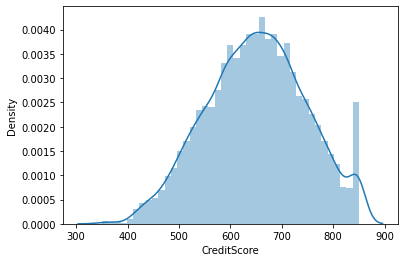

In [ ]:
sns.distplot(X.CreditScore)

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


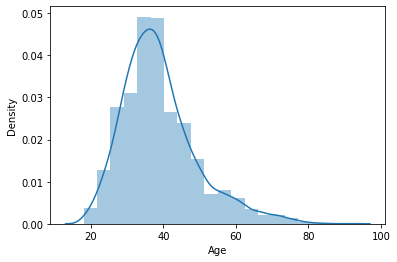

In [ ]:
sns.distplot(X.Age , bins = 20)

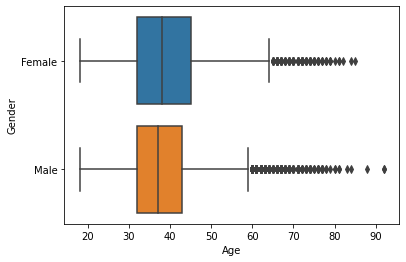

In [ ]:
sns.boxplot( y = 'Gender', x = 'Age', data = X )

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


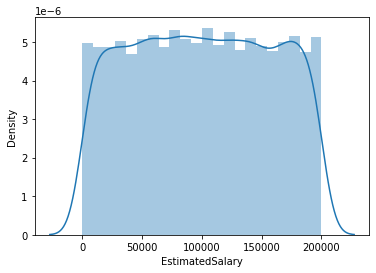

In [ ]:
sns.distplot(X.EstimatedSalary )

-------------------------

In [ ]:
X.head()

,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary
0,Hargrave,619,France,Female,42,2,0.00,1,1,1,101348.88
1,Hill,608,Spain,Female,41,1,83807.86,1,0,1,112542.58
2,Onio,502,France,Female,42,8,159660.80,3,1,0,113931.57
3,Boni,699,France,Female,39,1,0.00,2,0,0,93826.63
4,Mitchell,850,Spain,Female,43,2,125510.82,1,1,1,79084.10


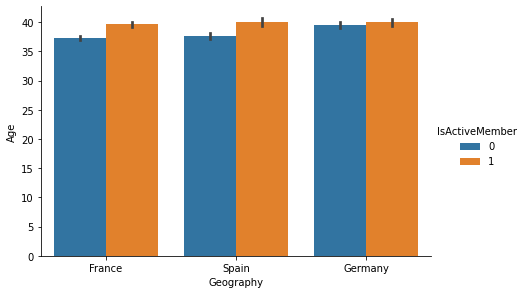

In [ ]:
sns.catplot(x = 'Geography', y = 'Age', hue = 'IsActiveMember', kind = 'bar', height=4, aspect=1.5 , data = X )

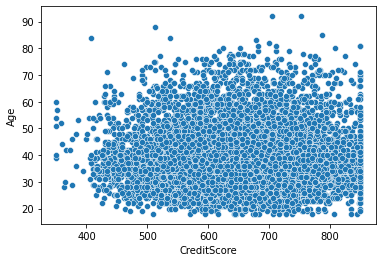

In [ ]:
sns.scatterplot(y = 'Age' , x ='CreditScore' , data = X  )

## EDA Using DataPrep Library

In [ ]:
#pip install dataprep

In [ ]:
from dataprep.eda import create_report

DataPrep Report
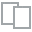
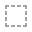
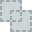
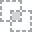
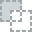
...
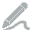
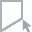
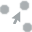
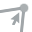
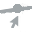

In [ ]:
create_report(X)

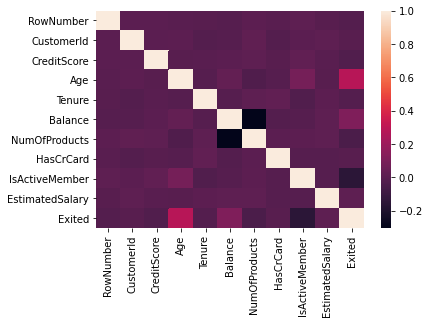

In [ ]:
sns.heatmap(df.corr())

### Missing Value Treatment

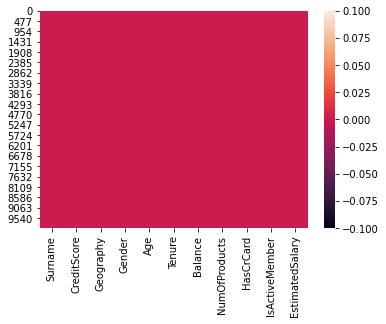

In [ ]:
sns.heatmap(X.isnull())

No missing Values present

-----------------------------

### Data Preprocessing

1. Encoding Categorical Variables

In [ ]:
X.head()

,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary
0,Hargrave,619,France,Female,42,2,0.00,1,1,1,101348.88
1,Hill,608,Spain,Female,41,1,83807.86,1,0,1,112542.58
2,Onio,502,France,Female,42,8,159660.80,3,1,0,113931.57
3,Boni,699,France,Female,39,1,0.00,2,0,0,93826.63
4,Mitchell,850,Spain,Female,43,2,125510.82,1,1,1,79084.10


In [ ]:
from sklearn.preprocessing import OneHotEncoder

In [ ]:
X = X.drop(['Surname'], axis =1)

In [ ]:
data = pd.get_dummies(X)

In [ ]:
data.head()

,CreditScore,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Geography_France,Geography_Germany,Geography_Spain,Gender_Female,Gender_Male
0,619,42,2,0.00,1,1,1,101348.88,1,0,0,1,0
1,608,41,1,83807.86,1,0,1,112542.58,0,0,1,1,0
2,502,42,8,159660.80,3,1,0,113931.57,1,0,0,1,0
3,699,39,1,0.00,2,0,0,93826.63,1,0,0,1,0
4,850,43,2,125510.82,1,1,1,79084.10,0,0,1,1,0


In [ ]:
data = data.drop(['Geography_France', 'Gender_Female'], axis = 1)

In [ ]:
x = data

In [ ]:
x.head()

,CreditScore,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Geography_Germany,Geography_Spain,Gender_Male
0,619,42,2,0.00,1,1,1,101348.88,0,0,0
1,608,41,1,83807.86,1,0,1,112542.58,0,1,0
2,502,42,8,159660.80,3,1,0,113931.57,0,0,0
3,699,39,1,0.00,2,0,0,93826.63,0,0,0
4,850,43,2,125510.82,1,1,1,79084.10,0,1,0


In [ ]:
y.head(
)

0    1
1    0
2    1
3    0
4    0
Name: Exited, dtype: int64

### Splitting Dataset and Feature Scaling 

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size = 0.2, random_state = 1)

In [ ]:
from sklearn.preprocessing import StandardScaler

In [ ]:
scaler = StandardScaler()

In [ ]:
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

## ANN Model Building 

In [ ]:
import tensorflow as tf

In [ ]:
tf.__version__

'2.5.0'

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import Adam

In [ ]:
model= Sequential([
                   Dense(64, activation = 'relu', input_shape = X_train.shape),
                   Dense(32 , activation = 'relu'),
                   Dense(1, activation = 'sigmoid')
])

In [ ]:
model.compile(optimizer = 'adam', loss = 'binary_crossentropy' , metrics = ['accuracy'])

In [ ]:
history = model.fit(X_train_scaled , y_train, epochs = 8 , batch_size = 64)

Model was constructed with shape (None, 8000, 11) for input KerasTensor(type_spec=TensorSpec(shape=(None, 8000, 11), dtype=tf.float32, name='dense_3_input'), name='dense_3_input', description="created by layer 'dense_3_input'"), but it was called on an input with incompatible shape (64, 11).
Model was constructed with shape (None, 8000, 11) for input KerasTensor(type_spec=TensorSpec(shape=(None, 8000, 11), dtype=tf.float32, name='dense_3_input'), name='dense_3_input', description="created by layer 'dense_3_input'"), but it was called on an input with incompatible shape (64, 11).


Epoch 1/8
125/125 [==============================] - 1s 1ms/step - loss: 0.4719 - accuracy: 0.7950
Epoch 2/8
125/125 [==============================] - 0s 1ms/step - loss: 0.3985 - accuracy: 0.8359
Epoch 3/8
125/125 [==============================] - 0s 1ms/step - loss: 0.3668 - accuracy: 0.8500
Epoch 4/8
125/125 [==============================] - 0s 1ms/step - loss: 0.3513 - accuracy: 0.8545
Epoch 5/8
125/125 [==============================] - 0s 1ms/step - loss: 0.3456 - accuracy: 0.8579
Epoch 6/8
125/125 [==============================] - 0s 1ms/step - loss: 0.3409 - accuracy: 0.8586
Epoch 7/8
125/125 [==============================] - 0s 1ms/step - loss: 0.3381 - accuracy: 0.8608
Epoch 8/8
125/125 [==============================] - 0s 1ms/step - loss: 0.3359 - accuracy: 0.8634


In [ ]:
his = pd.DataFrame(history.history)
his.head()

,loss,accuracy
0,0.471892,0.795000
1,0.398513,0.835875
2,0.366752,0.850000
3,0.351342,0.854500
4,0.345557,0.857875


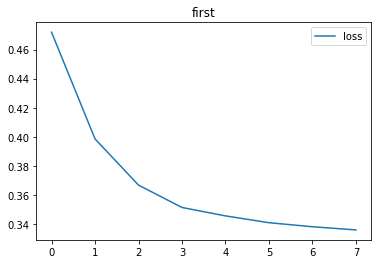

In [ ]:
loss_plot = his.plot(y = 'loss', title  = 'first')


In [ ]:
loss, accuracy = model.evaluate(X_test_scaled , y_test)

Model was constructed with shape (None, 8000, 11) for input KerasTensor(type_spec=TensorSpec(shape=(None, 8000, 11), dtype=tf.float32, name='dense_3_input'), name='dense_3_input', description="created by layer 'dense_3_input'"), but it was called on an input with incompatible shape (None, 11).


63/63 [==============================] - 0s 967us/step - loss: 0.3372 - accuracy: 0.8580
